In [2]:
pip install tensorboard

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [3]:
%load_ext tensorboard

In [10]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets,transforms
import matplotlib.pyplot as plt
import torch.nn.functional as F
import numpy as np
import tensorflow
import datetime
from torch.utils.tensorboard import SummaryWriter

writer = SummaryWriter("runs")

!rm -rf ./logs/

batch_size = 64
num_epochs = 100
num_classes = 10
num_hidden = 32
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.GaussianBlur(kernel_size = (27,27))
    ])


#Create Dataset
input_data = datasets.MNIST(root = './data', train=True, download = True, transform=transform)
valid_data = datasets.MNIST(root = './data', train=True, download = True, transform=transforms.ToTensor())


def randomize():
    #Generate Random Sequence
    rand_indx = torch.randperm(len(input_data))

    #Randomize Data
    in_shuffle_data = torch.utils.data.Subset(input_data,rand_indx)
    valid_shuffle_data = torch.utils.data.Subset(valid_data,rand_indx)

    #Create Dataloader
    input_loader = torch.utils.data.DataLoader(dataset=in_shuffle_data, batch_size = batch_size, shuffle = False)
    valid_loader = torch.utils.data.DataLoader(dataset=valid_shuffle_data, batch_size = 64, shuffle = False)

    return input_loader, valid_loader

class Reshape(nn.Module):
    def __init__(self, *args):
        super().__init__()
        self.shape = args

    def forward(self,x):
        return x.view(self.shape)


class Trim(nn.Module):
    def __init__(self, *args):
        super().__init__()

    def forward(self, x):
        return x[:,:,:28,:28]


class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()
        
        self.num_hidden = 32
        self.num_classes = 10
        
        self.encoder = nn.Sequential(
                nn.Conv2d(1,32, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.LeakyReLU(0.01),
                nn.Conv2d(32,64, stride=(2,2), kernel_size=(3,3), padding=1),
                nn.LeakyReLU(0.01),
                nn.Conv2d(64,128, stride=(2,2), kernel_size=(3,3), padding=1),
                nn.LeakyReLU(0.01),
                nn.Conv2d(128,256, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.LeakyReLU(0.01),
                nn.Conv2d(256,256, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.Flatten()       
        )


        self.z_mean = torch.nn.Linear(12544,32)
        self.z_log_var = torch.nn.Linear(12544,32)

        self.decoder = nn.Sequential(
                torch.nn.Linear(32, 12544),
                Reshape(-1, 256, 7, 7),
                nn.ConvTranspose2d(256, 256, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(256, 128, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(128, 64, stride=(2, 2), kernel_size=(3, 3), padding=1),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(64, 32, stride=(2, 2), kernel_size=(3, 3), padding=0),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(32, 1, stride=(1, 1), kernel_size=(3, 3), padding=0),
                Trim(),  # 1x29x29 -> 1x28x28
                nn.Sigmoid()
                )
        
        self.label_projector = nn.Sequential(
            nn.Linear(self.num_classes, self.num_hidden ),
            nn.ReLU()
        )
    
    def projection(self,z,y):
        projected_label = self.label_projector(y.float())
        return z + projected_label

    def encoding_fn(self,x):
        x = self.encoder(x)
        z_mean = self.z_mean(x)
        z_log_var = self.z_log_var(x)
        encoded = self.reparameterize(z_mean,z_log_var)
        return encoded, z_mean, z_log_var

    def reparameterize(self,z_mu, z_log_var):
        eps = torch.randn(z_mu.size(0), z_mu.size(1)).to(z_mu.get_device())
        z = z_mu+eps*torch.exp(z_log_var/2.)
        return z

    def forward(self,x,y):
        out = self.encoder(x)
        encoded, z_mean, z_log_var = self.encoding_fn(x)
        z = self.reparameterize(z_mean,z_log_var)
        decoded = self.decoder(self.projection(z,y))
        return encoded, z_mean, z_log_var, decoded
    
    def sample(self, num_samples,y):
        with torch.no_grad():
            z = torch.randn(num_samples, num_hidden).to(device)
            samples = self.decoder(self.projection(z,y))
        
        return samples

def loss_function(x, decoded, z_mean, x_log_var):
    reproduction_loss = torch.nn.functional.binary_cross_entropy(decoded,x, reduction = 'sum')
    KLD = -0.5*torch.sum(1+x_log_var-mean.pow(2)-x_log_var.exp())

    return reproduction_loss + KLD, reproduction_loss, KLD

model = VAE()
model.to(device)
criterion = nn.MSELoss(reduction = "sum")
optimizer = torch.optim.Adam(model.parameters(), lr = 1e-3, weight_decay = 1e-5)
outputs = []


for epoch in range(num_epochs):
    total_loss = 0
    input_loader, valid_loader = randomize()
    iter_valid = iter(valid_loader)
    n_total_steps = len(valid_loader)
    for i,batch in enumerate(input_loader):
        images,labels = batch
        images = images.to(device)
        labels = labels.to(device)
        labels_one_hot = F.one_hot(labels,num_classes).float().to(device)
        validation,_ = next(iter_valid)
        validation = validation.to(device)
        encoded,mean,logvar,decoded = model(images,labels_one_hot)
        loss,rpl,kld = loss_function(validation,decoded,mean,logvar)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()*len(batch)
    epoch_loss = total_loss/len(input_loader)
    writer.add_scalar('Loss', epoch_loss, epoch)
    
    print(
            "Epoch {}/{}: loss={:.4f}".format(epoch + 1, num_epochs, epoch_loss)
        )
    outputs.append((epoch, validation.cpu(), images.cpu(), decoded.cpu().detach()))

'''
def display_images(epoch, valid, edited, recon):
    fig, axes = plt.subplots(3, 10, figsize=(15, 5))
    for i in range(10):
        axes[0, i].imshow(valid[i].squeeze(), cmap='gray')
        axes[0, i].axis('off')
        axes[0, i].set_title('Original')
        axes[1, i].imshow(edited[i].squeeze(), cmap='gray')
        axes[1, i].axis('off')
        axes[1, i].set_title('Edited')
        axes[2, i].imshow(recon[i].squeeze(), cmap='gray')
        axes[2, i].axis('off')
        axes[2, i].set_title('Recreated')
    plt.suptitle(f'Epoch {epoch+1}')
    plt.show()

for epoch, valid, edited, recon in outputs:
    display_images(epoch, valid, edited, recon)
'''


# Define the show_images function to visualize the generated images
def show_images(images, labels=None):
    images = np.transpose(images, (0, 2, 3, 1))  # Change format to HWC for visualization
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
    for i, (image, label) in enumerate(zip(images, labels)):
        axes[i].imshow(image.squeeze(), cmap='gray')
        if labels is not None:
            axes[i].set_title(f'Label: {label}')
        axes[i].axis('off')
    plt.show()

# Assuming the cvae model is already defined and trained
num_samples = 10
random_labels = [8] * num_samples

# Function to one-hot encode the labels
def one_hot(labels, num_classes):
    return F.one_hot(labels, num_classes).float()

# Generate samples conditioned on the label '8'
y = one_hot(torch.LongTensor(random_labels), num_classes=10).to(device)
generated_samples = model.sample(num_samples = num_samples, y=y)

# Visualize the generated samples
show_images(generated_samples.cpu().detach().numpy(), labels=random_labels)


RuntimeError: CUDA error: device-side assert triggered
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


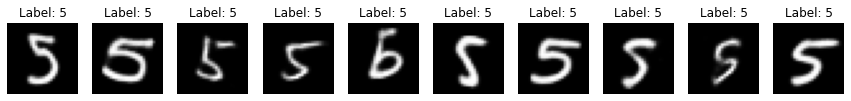

In [16]:

# Define the show_images function to visualize the generated images
def show_images(images, labels=None):
    images = np.transpose(images, (0, 2, 3, 1))  # Change format to HWC for visualization
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
    for i, (image, label) in enumerate(zip(images, labels)):
        axes[i].imshow(image.squeeze(), cmap='gray')
        if labels is not None:
            axes[i].set_title(f'Label: {label}')
        axes[i].axis('off')
    plt.show()

# Assuming the cvae model is already defined and trained
num_samples = 10
random_labels = [5] * num_samples

# Function to one-hot encode the labels
def one_hot(labels, num_classes):
    return F.one_hot(labels, num_classes).float()

# Generate samples conditioned on the label '8'
y = one_hot(torch.LongTensor(random_labels), num_classes=10).to(device)
generated_samples = model.sample(num_samples = num_samples, y=y)

# Visualize the generated samples
show_images(generated_samples.cpu().detach().numpy(), labels=random_labels)


In [11]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets,transforms
import matplotlib.pyplot as plt
import torch.nn.functional as F
import numpy as np
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'


batch_size = 64
num_epochs = 5
num_classes = 10
num_hidden = 32
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.GaussianBlur(kernel_size = (27,27))
    ])


#Create Dataset
input_data = datasets.MNIST(root = './data', train=True, download = True, transform=transform)
valid_data = datasets.MNIST(root = './data', train=True, download = True, transform=transforms.ToTensor())


def randomize():
    #Generate Random Sequence
    rand_indx = torch.randperm(len(input_data))

    #Randomize Data
    in_shuffle_data = torch.utils.data.Subset(input_data,rand_indx)
    valid_shuffle_data = torch.utils.data.Subset(valid_data,rand_indx)

    #Create Dataloader
    input_loader = torch.utils.data.DataLoader(dataset=in_shuffle_data, batch_size = batch_size, shuffle = False)
    valid_loader = torch.utils.data.DataLoader(dataset=valid_shuffle_data, batch_size = 64, shuffle = False)

    return input_loader, valid_loader

class Reshape(nn.Module):
    def __init__(self, *args):
        super().__init__()
        self.shape = args

    def forward(self,x):
        return x.view(self.shape)


class Trim(nn.Module):
    def __init__(self, *args):
        super().__init__()

    def forward(self, x):
        return x[:,:,:28,:28]


class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()
        
        self.num_hidden = 32
        self.num_classes = 10
        
        self.encoder = nn.Sequential(
                nn.Conv2d(1,32, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.LeakyReLU(0.01),
                nn.Conv2d(32,64, stride=(2,2), kernel_size=(3,3), padding=1),
                nn.LeakyReLU(0.01),
                nn.Conv2d(64,128, stride=(2,2), kernel_size=(3,3), padding=1),
                nn.LeakyReLU(0.01),
                nn.Conv2d(128,256, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.LeakyReLU(0.01),
                nn.Conv2d(256,512, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.LeakyReLU(0.01),
                nn.Conv2d(512,512, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.Flatten()       
        )


        self.z_mean = torch.nn.Linear(25088,32)
        self.z_log_var = torch.nn.Linear(25088,32)

        self.decoder = nn.Sequential(
                torch.nn.Linear(32, 25088),
                Reshape(-1, 512, 7, 7),
                nn.ConvTranspose2d(512, 512, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(512, 256, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(256, 128, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(128, 64, stride=(2, 2), kernel_size=(3, 3), padding=1),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(64, 32, stride=(2, 2), kernel_size=(3, 3), padding=0),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(32, 1, stride=(1, 1), kernel_size=(3, 3), padding=0),
                Trim(),  # 1x29x29 -> 1x28x28
                nn.Sigmoid()
                )
        
        self.label_projector = nn.Sequential(
            nn.Linear(self.num_classes, self.num_hidden ),
            nn.ReLU()
        )
    
    def projection(self,z,y):
        projected_label = self.label_projector(y.float())
        return z + projected_label

    def encoding_fn(self,x):
        x = self.encoder(x)
        z_mean = self.z_mean(x)
        z_log_var = self.z_log_var(x)
        encoded = self.reparameterize(z_mean,z_log_var)
        return encoded, z_mean, z_log_var

    def reparameterize(self,z_mu, z_log_var):
        eps = torch.randn(z_mu.size(0), z_mu.size(1))#.to(z_mu.get_device())
        z = z_mu+eps*torch.exp(z_log_var/2.)
        return z

    def forward(self,x,y):
        out = self.encoder(x)
        encoded, z_mean, z_log_var = self.encoding_fn(x)
        z = self.reparameterize(z_mean,z_log_var)
        decoded = self.decoder(self.projection(z,y))
        return encoded, z_mean, z_log_var, decoded
    
    def sample(self, num_samples,y):
        with torch.no_grad():
            z = torch.randn(num_samples, num_hidden)#.to(device)
            samples = self.decoder(self.projection(z,y))
        
        return samples

def loss_function(x, decoded, z_mean, x_log_var):
    reproduction_loss = torch.nn.functional.binary_cross_entropy(decoded,x, reduction = 'sum')
    KLD = -0.5*torch.sum(1+x_log_var-mean.pow(2)-x_log_var.exp())

    return reproduction_loss + KLD, reproduction_loss, KLD

model = VAE()
#model.to(device)
criterion = nn.MSELoss(reduction = "sum")
optimizer = torch.optim.Adam(model.parameters(), lr = 1e-3, weight_decay = 1e-5)

outputs = []


for epoch in range(num_epochs):
    total_loss = 0
    input_loader, valid_loader = randomize()
    iter_valid = iter(valid_loader)
    for batch in input_loader:
        images,labels = batch
        images = images#.to(device)
        labels = labels#.to(device)
        labels_one_hot = F.one_hot(labels,num_classes).float()#.to(device)
        validation,_ = next(iter_valid)
        validation = validation#.to(device)
        encoded,mean,logvar,decoded = model(images,labels_one_hot)
        
        '''
        print(f"Validation - Min: {validation.min().item()}, Max: {validation.max().item*()}")
        print(f"Decoded - Min: {decoded.min().item()}, Max: {decoded.max().item*()}")
        print(f"Mean - Min: {mean.min().item()}, Max: {mean.max().item()}")
        print(f"Logvar - Min: {logvar.min().item()}, Max: {logvar.max().item*()}")

        '''

        loss,rpl,kld = loss_function(validation,decoded,mean,logvar)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()*len(batch)
        
    #print(f'Loss: {loss} \n RPL: {rpl} \n KLD: {kld}')
    epoch_loss = total_loss/len(input_loader)
    #print(f'Epoch: {epoch+1}, Loss: {epoch_loss}:.4f}')
    
    print(
            "Epoch {}/{}: loss={:.4f}".format(epoch + 1, num_epochs, epoch_loss)
        )
    outputs.append((epoch, validation.cpu(), images.cpu(), decoded.cpu().detach()))

'''
def display_images(epoch, valid, edited, recon):
    fig, axes = plt.subplots(3, 10, figsize=(15, 5))
    for i in range(10):
        axes[0, i].imshow(valid[i].squeeze(), cmap='gray')
        axes[0, i].axis('off')
        axes[0, i].set_title('Original')
        axes[1, i].imshow(edited[i].squeeze(), cmap='gray')
        axes[1, i].axis('off')
        axes[1, i].set_title('Edited')
        axes[2, i].imshow(recon[i].squeeze(), cmap='gray')
        axes[2, i].axis('off')
        axes[2, i].set_title('Recreated')
    plt.suptitle(f'Epoch {epoch+1}')
    plt.show()

for epoch, valid, edited, recon in outputs:
    display_images(epoch, valid, edited, recon)
'''


# Define the show_images function to visualize the generated images
def show_images(images, labels=None):
    images = np.transpose(images, (0, 2, 3, 1))  # Change format to HWC for visualization
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
    for i, (image, label) in enumerate(zip(images, labels)):
        axes[i].imshow(image.squeeze(), cmap='gray')
        if labels is not None:
            axes[i].set_title(f'Label: {label}')
        axes[i].axis('off')
    plt.show()

# Assuming the cvae model is already defined and trained
num_samples = 10
random_labels = [8] * num_samples

# Function to one-hot encode the labels
def one_hot(labels, num_classes):
    return F.one_hot(labels, num_classes).float()

# Generate samples conditioned on the label '8'
y = one_hot(torch.LongTensor(random_labels), num_classes=10)#.to(device)
generated_samples = model.sample(num_samples = num_samples, y=y)

# Visualize the generated samples
show_images(generated_samples.cpu().detach().numpy(), labels=random_labels)


RuntimeError: CUDA error: device-side assert triggered
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


Epoch 1/100: loss=20810.3605
Epoch 2/100: loss=15943.5509
Epoch 3/100: loss=15180.9221
Epoch 4/100: loss=14790.7068
Epoch 5/100: loss=14560.5115
Epoch 6/100: loss=14371.0516
Epoch 7/100: loss=14231.5472
Epoch 8/100: loss=14102.9233
Epoch 9/100: loss=14012.8265
Epoch 10/100: loss=13917.7891
Epoch 11/100: loss=13854.5534
Epoch 12/100: loss=13778.4247
Epoch 13/100: loss=13729.1506
Epoch 14/100: loss=13679.2164
Epoch 15/100: loss=13632.0662
Epoch 16/100: loss=13589.8169
Epoch 17/100: loss=13544.6143
Epoch 18/100: loss=13512.2383
Epoch 19/100: loss=13491.0485
Epoch 20/100: loss=13461.8785
Epoch 21/100: loss=13426.7206
Epoch 22/100: loss=13407.2079
Epoch 23/100: loss=13381.9240
Epoch 24/100: loss=13360.3823
Epoch 25/100: loss=13337.0686
Epoch 26/100: loss=13318.7211
Epoch 27/100: loss=13299.3791
Epoch 28/100: loss=13281.9758
Epoch 29/100: loss=13274.5602
Epoch 30/100: loss=13253.5503
Epoch 31/100: loss=13235.4618
Epoch 32/100: loss=13223.6200
Epoch 33/100: loss=13213.1675
Epoch 34/100: loss=

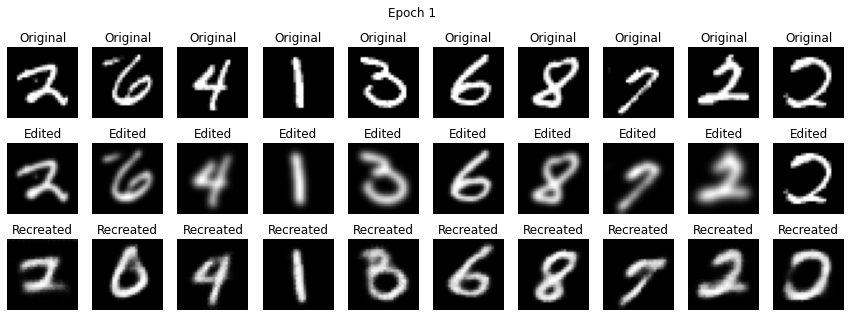

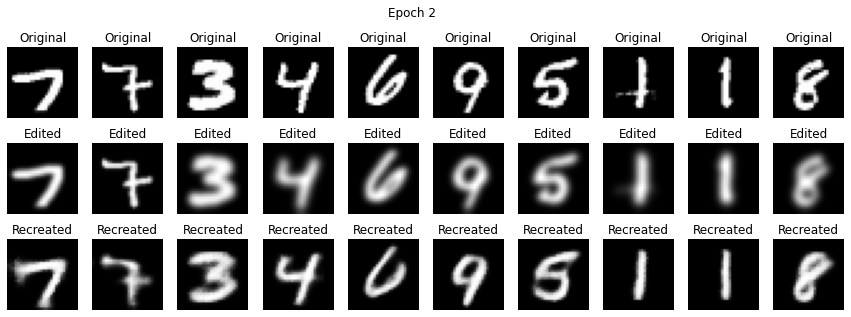

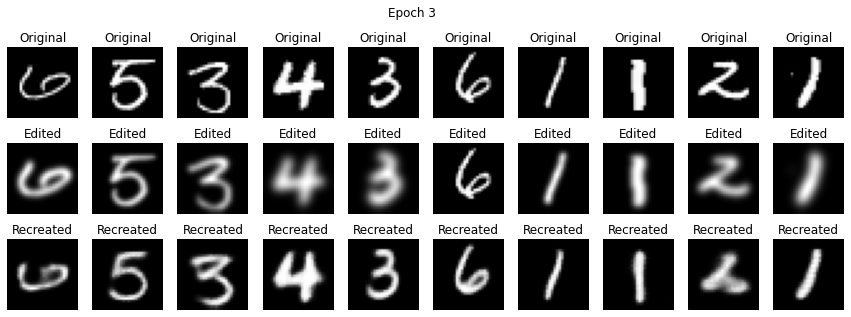

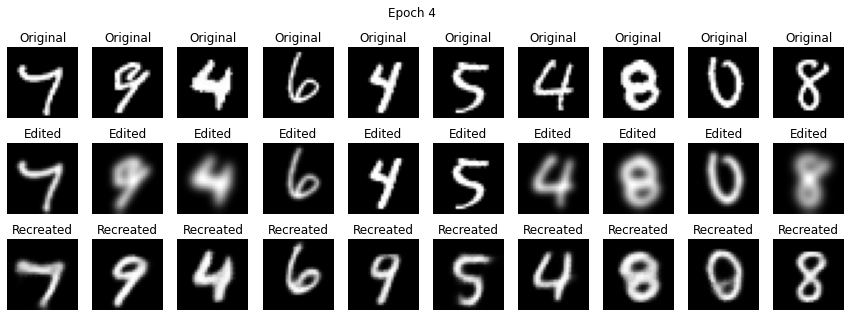

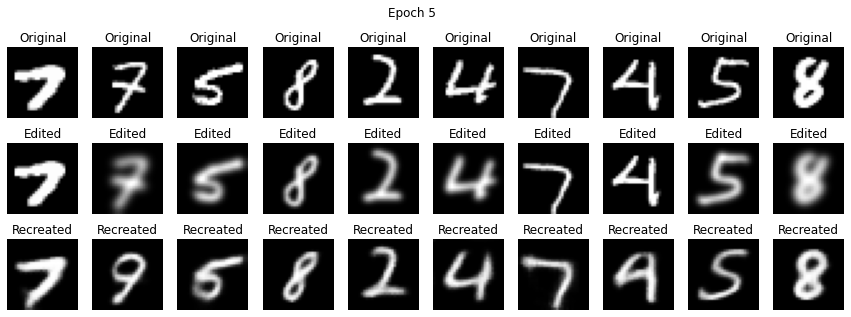

...

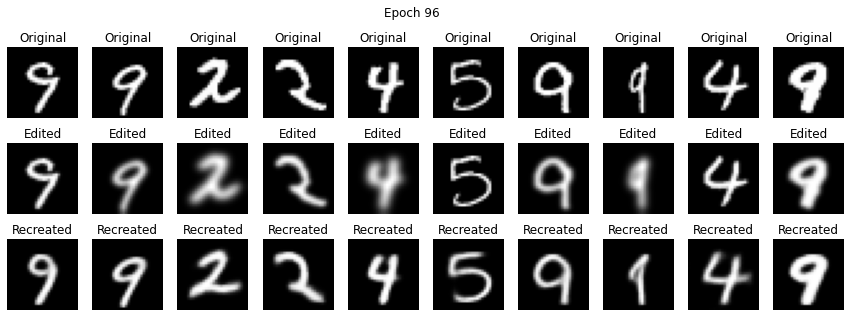

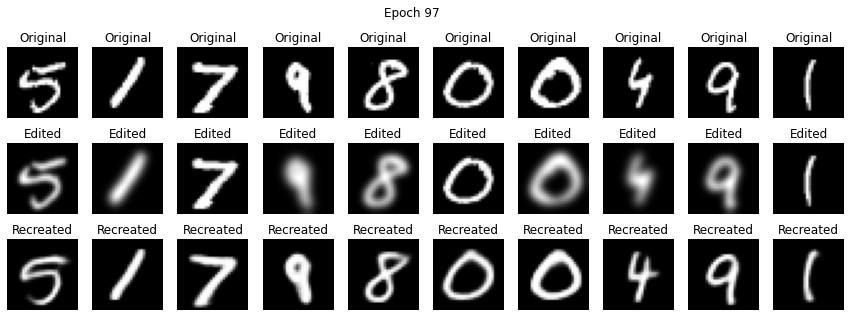

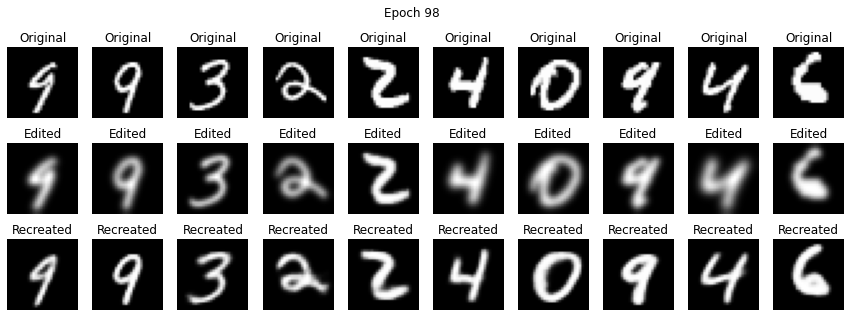

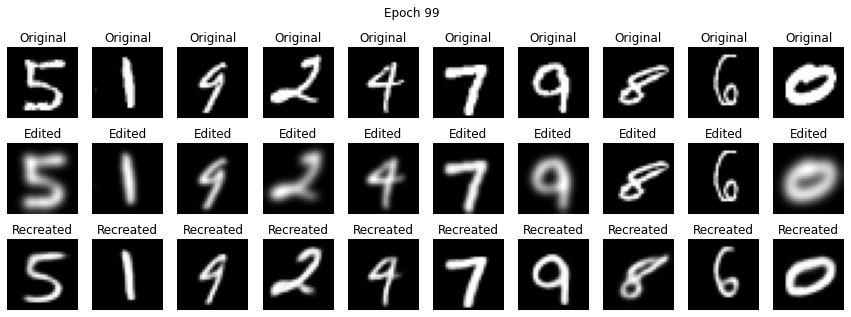

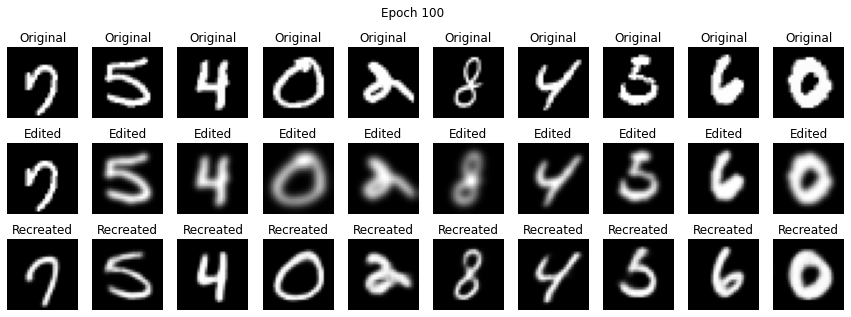

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets,transforms
import matplotlib.pyplot as plt

batch_size = 64
num_epochs = 100
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.GaussianBlur(kernel_size = (27,27))
    ])


#Create Dataset
input_data = datasets.MNIST(root = './data', train=True, download = True, transform=transform)
valid_data = datasets.MNIST(root = './data', train=True, download = True, transform=transforms.ToTensor())


def randomize():
    #Generate Random Sequence
    rand_indx = torch.randperm(len(input_data))

    #Randomize Data
    in_shuffle_data = torch.utils.data.Subset(input_data,rand_indx)
    valid_shuffle_data = torch.utils.data.Subset(valid_data,rand_indx)

    #Create Dataloader
    input_loader = torch.utils.data.DataLoader(dataset=in_shuffle_data, batch_size = batch_size, shuffle = False)
    valid_loader = torch.utils.data.DataLoader(dataset=valid_shuffle_data, batch_size = 64, shuffle = False)

    return input_loader, valid_loader

class Reshape(nn.Module):
    def __init__(self, *args):
        super().__init__()
        self.shape = args

    def forward(self,x):
        return x.view(self.shape)


class Trim(nn.Module):
    def __init__(self, *args):
        super().__init__()

    def forward(self, x):
        return x[:,:,:28,:28]


class VAE(nn.Module):
    def __init__(self):
        super().__init__()

        self.encoder = nn.Sequential(
                nn.Conv2d(1,32, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(32),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(32,64, stride=(2,2), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(64),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(64,128, stride=(2,2), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(128,256, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(256,256, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Flatten(),
                
        )


        self.z_mean = torch.nn.Linear(12544,10)
        self.z_log_var = torch.nn.Linear(12544,10)

        self.decoder = nn.Sequential(
                torch.nn.Linear(10, 12544),
                Reshape(-1, 256, 7, 7),

                nn.ConvTranspose2d(256, 256, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.ConvTranspose2d(256, 128, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),


                nn.ConvTranspose2d(128, 64, stride=(2, 2), kernel_size=(3, 3), padding=1),
                nn.BatchNorm2d(64),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),


                nn.ConvTranspose2d(64, 32, stride=(2, 2), kernel_size=(3, 3), padding=0),
                nn.BatchNorm2d(32),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.ConvTranspose2d(32, 1, stride=(1, 1), kernel_size=(3, 3), padding=0),
                Trim(), 
                nn.Sigmoid()
                )

    def encoding_fn(self,x):
        x = self.encoder(x)
        z_mean = self.z_mean(x)
        z_log_var = self.z_log_var(x)
        encoded = self.reparameterize(z_mean,z_log_var)
        return encoded, z_mean, z_log_var

    def reparameterize(self,z_mu, z_log_var):
        eps = torch.randn(z_mu.size(0), z_mu.size(1)).to(z_mu.get_device())
        z = z_mu+eps*torch.exp(z_log_var/2.)
        return z

    def forward(self,x):
        out = self.encoder(x)
        encoded, z_mean, z_log_var = self.encoding_fn(x)
        '''
        z_mean,z_log_var = self.z_mean(x), self.z_log_var(x)
        encoded = self.reparameterize(z_mean, z_log_var)
        '''
        decoded = self.decoder(encoded)
        return encoded, z_mean, z_log_var, decoded

def loss_function(x, decoded, z_mean, x_log_var):
    reproduction_loss = torch.nn.functional.binary_cross_entropy(decoded,x, reduction = 'sum')
    KLD = -0.5*torch.sum(1+x_log_var-mean.pow(2)-x_log_var.exp())

    return reproduction_loss + KLD, reproduction_loss, KLD

model = VAE()
model.to(device)
criterion = nn.MSELoss(reduction = "sum")
optimizer = torch.optim.Adam(model.parameters(), lr = 1e-3, weight_decay = 1e-5)

outputs = []


for epoch in range(num_epochs):
    total_loss = 0
    input_loader, valid_loader = randomize()
    iter_valid = iter(valid_loader)
    for batch in input_loader:
        images,_ = batch
        images = images.to(device)
        validation,_ = next(iter_valid)
        validation = validation.to(device)
        encoded,mean,logvar,decoded = model(images)
        loss,rpl,kld = loss_function(validation,decoded,mean,logvar)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()*len(batch)
        
    #print(f'Loss: {loss} \n RPL: {rpl} \n KLD: {kld}')
    epoch_loss = total_loss/len(input_loader)
    #print(f'Epoch: {epoch+1}, Loss: {epoch_loss}:.4f}')
    
    print(
            "Epoch {}/{}: loss={:.4f}".format(epoch + 1, num_epochs, epoch_loss)
        )
    outputs.append((epoch, validation.cpu(), images.cpu(), decoded.cpu().detach()))


def display_images(epoch, valid, edited, recon):
    fig, axes = plt.subplots(3, 10, figsize=(15, 5))
    for i in range(10):
        axes[0, i].imshow(valid[i].squeeze(), cmap='gray')
        axes[0, i].axis('off')
        axes[0, i].set_title('Original')
        axes[1, i].imshow(edited[i].squeeze(), cmap='gray')
        axes[1, i].axis('off')
        axes[1, i].set_title('Edited')
        axes[2, i].imshow(recon[i].squeeze(), cmap='gray')
        axes[2, i].axis('off')
        axes[2, i].set_title('Recreated')
    plt.suptitle(f'Epoch {epoch+1}')
    plt.show()

for epoch, valid, edited, recon in outputs:
    display_images(epoch, valid, edited, recon)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets,transforms
import matplotlib.pyplot as plt
from Dataloader import Mugs_Datatset
from torch.utils.data import DataLoader
from PIL import Image
torch.cuda.empty_cache()

batch_size = 10
num_epochs = 100
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


    
transform = transforms.Compose([transforms.ToTensor(),transforms.Resize((830,965))])

dataset = Mugs_Datatset(csv_file = 'label_maker.xlsx', root_dir = 'images', transform = transform)
train_loader = DataLoader(dataset= dataset, shuffle = True, batch_size = batch_size)

max_images = 0
min_images = 0

'''
for batch in train_loader:
    images,label = batch
    if torch.max(images)>max_images:
        max_images = torch.max(images)
    if torch.min(images)< min_images:
        min_images = torch.min(images)

print(max_images)
print(min_images)


'''
class Reshape(nn.Module):
    def __init__(self, *args):
        super().__init__()
        self.shape = args

    def forward(self,x):
        return x.view(self.shape)


class Trim(nn.Module):
    def __init__(self, *args):
        super().__init__()

    def forward(self, x):
        return x[:,:,:830,:965]


class VAE(nn.Module):
    def __init__(self):
        super().__init__()

        self.encoder = nn.Sequential(
                nn.Conv2d(3,32, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(32),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(32,64, stride=(2,2), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(64),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(64,128, stride=(2,2), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(128,256, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(256,256, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Flatten(),
                
        )


        self.z_mean = torch.nn.Linear(12886016,200)
        self.z_log_var = torch.nn.Linear(12886016,200)

        self.decoder = nn.Sequential(
                torch.nn.Linear(200, 12886016),
                Reshape(-1, 256, 208, 242),

                nn.ConvTranspose2d(256, 256, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.ConvTranspose2d(256, 128, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),


                nn.ConvTranspose2d(128, 64, stride=(2, 2), kernel_size=(3, 3), padding=1),
                nn.BatchNorm2d(64),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),


                nn.ConvTranspose2d(64, 32, stride=(2, 2), kernel_size=(3, 3), padding=0),
                nn.BatchNorm2d(32),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.ConvTranspose2d(32, 3, stride=(1, 1), kernel_size=(3, 3), padding=0),
                Trim(), 
                nn.Sigmoid()
                )

    def encoding_fn(self,x):
        x = self.encoder(x)
        z_mean = self.z_mean(x)
        z_log_var = self.z_log_var(x)
        encoded = self.reparameterize(z_mean,z_log_var)
        return encoded, z_mean, z_log_var

    def reparameterize(self,z_mu, z_log_var):
        eps = torch.randn(z_mu.size(0), z_mu.size(1))#.to(z_mu.get_device())
        z = z_mu+eps*torch.exp(z_log_var/2.)
        return z

    def forward(self,x):
        out = self.encoder(x)
        encoded, z_mean, z_log_var = self.encoding_fn(x)
        
        decoded = self.decoder(encoded)
        return encoded, z_mean, z_log_var, decoded

def loss_function(x, decoded, z_mean, x_log_var):

    if torch.isnan(x).any(): print("NaNs detected in input images") 
    if torch.isnan(z_mean).any(): print("NaNs detected in z_mean") 
    if torch.isnan(x_log_var).any(): print("NaNs detected in z_log_var")
    if torch.isnan(decoded).any(): print("NaNs detected in decoded values") 


    assert torch.min(decoded)>= 0 and torch.max(decoded)<=1, f"Decoded values are not in range Max Value: {torch.min(decoded)}, Min Value: {torch.max(decoded)}"
    assert torch.min(x)>= 0 and torch.max(x)<=1, "X values are not in range"
    reproduction_loss = torch.nn.functional.binary_cross_entropy(decoded,x, reduction = 'sum')
    KLD = -0.5*torch.sum(1+x_log_var-mean.pow(2)-x_log_var.exp())

    return reproduction_loss + KLD, reproduction_loss, KLD

model = VAE()
#model.to(device)
criterion = nn.MSELoss(reduction = "sum")
optimizer = torch.optim.Adam(model.parameters(), lr = 0.0001, weight_decay = 1e-5)

outputs = []

with torch.autograd.detect_anomaly(check_nan = True):
    for epoch in range(num_epochs):
        total_loss = 0
        for batch in train_loader:
            images,_ = batch
            images = images#.to(device)
            encoded,mean,logvar,decoded = model(images)
            loss,rpl,kld = loss_function(images,decoded,mean,logvar)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            total_loss += loss.item()*len(batch)
            
        #print(f'Loss: {loss} \n RPL: {rpl} \n KLD: {kld}')
        epoch_loss = total_loss/len(train_loader)
        #print(f'Epoch: {epoch+1}, Loss: {epoch_loss}:.4f}')
        
        print(
                "Epoch {}/{}: loss={:.4f}".format(epoch + 1, num_epochs, epoch_loss)
            )
        outputs.append((epoch, images.cpu(), decoded.cpu().detach()))

torch.cuda.empty_cache()


























'''
def display_images(epoch, valid, edited, recon):
    fig, axes = plt.subplots(3, 10, figsize=(15, 5))
    for i in range(10):
        axes[0, i].imshow(valid[i].squeeze(), cmap='gray')
        axes[0, i].axis('off')
        axes[0, i].set_title('Original')
        axes[1, i].imshow(edited[i].squeeze(), cmap='gray')
        axes[1, i].axis('off')
        axes[1, i].set_title('Edited')
        axes[2, i].imshow(recon[i].squeeze(), cmap='gray')
        axes[2, i].axis('off')
        axes[2, i].set_title('Recreated')
    plt.suptitle(f'Epoch {epoch+1}')
    plt.show()

for epoch, valid, edited, recon in outputs:
    display_images(epoch, valid, edited, recon)

'''

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets,transforms
import matplotlib.pyplot as plt
from Dataloader import Mugs_Datatset
from torch.utils.data import DataLoader
from PIL import Image
torch.cuda.empty_cache()

batch_size = 10
num_epochs = 100
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


    
transform = transforms.Compose([transforms.ToTensor(),transforms.Resize((830,965))])

dataset = Mugs_Datatset(csv_file = 'label_maker.xlsx', root_dir = 'images', transform = transform)
train_loader = DataLoader(dataset= dataset, shuffle = True, batch_size = batch_size)

max_images = 0
min_images = 0

'''
for batch in train_loader:
    images,label = batch
    if torch.max(images)>max_images:
        max_images = torch.max(images)
    if torch.min(images)< min_images:
        min_images = torch.min(images)

print(max_images)
print(min_images)


'''
class Reshape(nn.Module):
    def __init__(self, *args):
        super().__init__()
        self.shape = args

    def forward(self,x):
        return x.view(self.shape)


class Trim(nn.Module):
    def __init__(self, *args):
        super().__init__()

    def forward(self, x):
        return x[:,:,:830,:965]


class VAE(nn.Module):
    def __init__(self):
        super().__init__()

        self.encoder = nn.Sequential(
                nn.Conv2d(3,32, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(32),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(32,64, stride=(2,2), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(64),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(64,128, stride=(2,2), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(128,256, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(256,256, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Flatten(),
                
        )


        self.z_mean = torch.nn.Linear(12886016,200)
        self.z_log_var = torch.nn.Linear(12886016,200)

        self.decoder = nn.Sequential(
                torch.nn.Linear(200, 12886016),
                Reshape(-1, 256, 208, 242),

                nn.ConvTranspose2d(256, 256, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.ConvTranspose2d(256, 128, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),


                nn.ConvTranspose2d(128, 64, stride=(2, 2), kernel_size=(3, 3), padding=1),
                nn.BatchNorm2d(64),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),


                nn.ConvTranspose2d(64, 32, stride=(2, 2), kernel_size=(3, 3), padding=0),
                nn.BatchNorm2d(32),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.ConvTranspose2d(32, 3, stride=(1, 1), kernel_size=(3, 3), padding=0),
                Trim(), 
                nn.Sigmoid()
                )

    def encoding_fn(self,x):
        x = self.encoder(x)
        z_mean = self.z_mean(x)
        z_log_var = self.z_log_var(x)
        encoded = self.reparameterize(z_mean,z_log_var)
        return encoded, z_mean, z_log_var

    def reparameterize(self,z_mu, z_log_var):
        eps = torch.randn(z_mu.size(0), z_mu.size(1))#.to(z_mu.get_device())
        z = z_mu+eps*torch.exp(z_log_var/2.)
        return z

    def forward(self,x):
        out = self.encoder(x)
        encoded, z_mean, z_log_var = self.encoding_fn(x)
        
        decoded = self.decoder(encoded)
        return encoded, z_mean, z_log_var, decoded

def loss_function(x, decoded, z_mean, x_log_var):

    if torch.isnan(x).any(): print("NaNs detected in input images") 
    if torch.isnan(z_mean).any(): print("NaNs detected in z_mean") 
    if torch.isnan(x_log_var).any(): print("NaNs detected in z_log_var")
    if torch.isnan(decoded).any(): print("NaNs detected in decoded values") 


    assert torch.min(decoded)>= 0 and torch.max(decoded)<=1, f"Decoded values are not in range Max Value: {torch.min(decoded)}, Min Value: {torch.max(decoded)}"
    assert torch.min(x)>= 0 and torch.max(x)<=1, "X values are not in range"
    reproduction_loss = torch.nn.functional.binary_cross_entropy(decoded,x, reduction = 'sum')
    KLD = -0.5*torch.sum(1+x_log_var-mean.pow(2)-x_log_var.exp())

    return reproduction_loss + KLD, reproduction_loss, KLD

model = VAE()
#model.to(device)
criterion = nn.MSELoss(reduction = "sum")
optimizer = torch.optim.Adam(model.parameters(), lr = 0.0001, weight_decay = 1e-5)

outputs = []

with torch.autograd.detect_anomaly(check_nan = True):
    for epoch in range(num_epochs):
        total_loss = 0
        for batch in train_loader:
            images,_ = batch
            images = images#.to(device)
            encoded,mean,logvar,decoded = model(images)
            loss,rpl,kld = loss_function(images,decoded,mean,logvar)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            total_loss += loss.item()*len(batch)
            
        #print(f'Loss: {loss} \n RPL: {rpl} \n KLD: {kld}')
        epoch_loss = total_loss/len(train_loader)
        #print(f'Epoch: {epoch+1}, Loss: {epoch_loss}:.4f}')
        
        print(
                "Epoch {}/{}: loss={:.4f}".format(epoch + 1, num_epochs, epoch_loss)
            )
        outputs.append((epoch, images.cpu(), decoded.cpu().detach()))

torch.cuda.empty_cache()


























'''
def display_images(epoch, valid, edited, recon):
    fig, axes = plt.subplots(3, 10, figsize=(15, 5))
    for i in range(10):
        axes[0, i].imshow(valid[i].squeeze(), cmap='gray')
        axes[0, i].axis('off')
        axes[0, i].set_title('Original')
        axes[1, i].imshow(edited[i].squeeze(), cmap='gray')
        axes[1, i].axis('off')
        axes[1, i].set_title('Edited')
        axes[2, i].imshow(recon[i].squeeze(), cmap='gray')
        axes[2, i].axis('off')
        axes[2, i].set_title('Recreated')
    plt.suptitle(f'Epoch {epoch+1}')
    plt.show()

for epoch, valid, edited, recon in outputs:
    display_images(epoch, valid, edited, recon)

'''

In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets,transforms
import matplotlib.pyplot as plt
import torch.nn.functional as F
import numpy as np
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'


batch_size = 64
num_epochs = 500
num_classes = 10
num_hidden = 32
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.GaussianBlur(kernel_size = (27,27))
    ])


#Create Dataset
input_data = datasets.MNIST(root = './data', train=True, download = True, transform=transform)
valid_data = datasets.MNIST(root = './data', train=True, download = True, transform=transforms.ToTensor())

'''
def initial_weights(module):
    if isinstance(module, nn.Conv2d) or isinstance(module,nn.Linear):
        nn.init.xavier_normal_(module.weight)
'''
def randomize():
    #Generate Random Sequence
    rand_indx = torch.randperm(len(input_data))

    #Randomize Data
    in_shuffle_data = torch.utils.data.Subset(input_data,rand_indx)
    valid_shuffle_data = torch.utils.data.Subset(valid_data,rand_indx)

    #Create Dataloader
    input_loader = torch.utils.data.DataLoader(dataset=in_shuffle_data, batch_size = batch_size, shuffle = False)
    valid_loader = torch.utils.data.DataLoader(dataset=valid_shuffle_data, batch_size = 64, shuffle = False)

    return input_loader, valid_loader

class Reshape(nn.Module):
    def __init__(self, *args):
        super().__init__()
        self.shape = args

    def forward(self,x):
        return x.view(self.shape)


class Trim(nn.Module):
    def __init__(self, *args):
        super().__init__()

    def forward(self, x):
        return x[:,:,:28,:28]


class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()
        
        self.num_hidden = 32
        self.num_classes = 10
        
        self.encoder = nn.Sequential(
                nn.Conv2d(1,32, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(32),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(32,64, stride=(2,2), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(64),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(64,128, stride=(2,2), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(128,256, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(256,256, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Flatten(),
                
        )

        self.z_mean = torch.nn.Linear(12544,32)
        self.z_log_var = torch.nn.Linear(12544,32)

        self.decoder = nn.Sequential(
                torch.nn.Linear(32, 12544),
                Reshape(-1, 256, 7, 7),

                nn.ConvTranspose2d(256, 256, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.ConvTranspose2d(256, 128, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),


                nn.ConvTranspose2d(128, 64, stride=(2, 2), kernel_size=(3, 3), padding=1),
                nn.BatchNorm2d(64),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),


                nn.ConvTranspose2d(64, 32, stride=(2, 2), kernel_size=(3, 3), padding=0),
                nn.BatchNorm2d(32),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.ConvTranspose2d(32, 1, stride=(1, 1), kernel_size=(3, 3), padding=0),
                Trim(), 
                nn.Sigmoid()
                )
        
        self.label_projector = nn.Sequential(
            nn.Linear(self.num_classes, self.num_hidden ),
            nn.ReLU()
        )
    
    def projection(self,z,y):
        projected_label = self.label_projector(y.float())
        return z + projected_label

    def encoding_fn(self,x):
        x = self.encoder(x)
        z_mean = self.z_mean(x)
        z_log_var = self.z_log_var(x)
        encoded = self.reparameterize(z_mean,z_log_var)
        return encoded, z_mean, z_log_var

    def reparameterize(self,z_mu, z_log_var):
        eps = torch.randn(z_mu.size(0), z_mu.size(1)).to(z_mu.get_device())
        z = z_mu+eps*torch.exp(z_log_var/2.)
        return z

    def forward(self,x,y):
        #out = self.encoder(x)
        encoded, z_mean, z_log_var = self.encoding_fn(x)
        #z = self.reparameterize(z_mean,z_log_var)
        decoded = self.decoder(self.projection(encoded,y))
        return encoded, z_mean, z_log_var, decoded
    
    def sample(self, num_samples,y):
        with torch.no_grad():
            z = torch.randn(num_samples, num_hidden).to(device)
            samples = self.decoder(self.projection(z,y))
        
        return samples

def loss_function(x, decoded, z_mean, x_log_var):

    assert torch.min(decoded)>= 0 and torch.max(decoded)<=1, f"Decoded values are not in range Max Value: {torch.min(decoded)}, Min Value: {torch.max(decoded)}"
    assert torch.min(x)>= 0 and torch.max(x)<=1, "X values are not in range"
    reproduction_loss = torch.nn.functional.binary_cross_entropy(decoded,x, reduction = 'sum')
    KLD = -0.5*torch.sum(1+x_log_var-mean.pow(2)-x_log_var.exp())

    return reproduction_loss + KLD, reproduction_loss, KLD

model = VAE()
model.to(device)
criterion = nn.MSELoss(reduction = "sum")
optimizer = torch.optim.Adam(model.parameters(), lr = 0.0001, weight_decay = 1e-5)

outputs = []


for epoch in range(num_epochs):
    total_loss = 0
    input_loader, valid_loader = randomize()
    iter_valid = iter(valid_loader)
    for batch in input_loader:
        images,labels = batch
        images = images.to(device)
        labels = labels.to(device)
        labels_one_hot = F.one_hot(labels,num_classes).float().to(device)
        validation,_ = next(iter_valid)
        validation = validation.to(device)
        encoded,mean,logvar,decoded = model(images,labels_one_hot)
        loss,rpl,kld = loss_function(validation,decoded,mean,logvar)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()*len(batch)
        
    #print(f'Loss: {loss} \n RPL: {rpl} \n KLD: {kld}')
    epoch_loss = total_loss/len(input_loader)
    #print(f'Epoch: {epoch+1}, Loss: {epoch_loss}:.4f}')
    
    print(
            "Epoch {}/{}: loss={:.4f}".format(epoch + 1, num_epochs, epoch_loss)
        )
    outputs.append((epoch, validation.cpu(), images.cpu(), decoded.cpu().detach()))


# Define the show_images function to visualize the generated images
def show_images(images, labels=None, filename='generated_images.png'):
    images = np.transpose(images, (0, 2, 3, 1))  # Change format to HWC for visualization
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
    for i, (image, label) in enumerate(zip(images, labels)):
        axes[i].imshow(image.squeeze(), cmap='gray')
        if labels is not None:
            axes[i].set_title(f'Label: {label}')
        axes[i].axis('off')
    plt.savefig(filename)
    plt.close()
    print(f"Images saved to {filename}")



for i in range(10):
    num_samples = 10
    random_labels = [i] * num_samples


    # Function to one-hot encode the labels
    def one_hot(labels, num_classes):
        return F.one_hot(labels, num_classes).float()


    # Generate samples conditioned on the current label 'i'
    y = one_hot(torch.LongTensor(random_labels), num_classes=10).to(device)
    print(f"Generating samples for label {i}...")
    generated_samples = model.sample(num_samples=num_samples, y=y)
    print("Samples generated. Visualizing...")


    # Visualize the generated samples
    show_images(generated_samples.cpu().detach().numpy(), labels=random_labels, filename=f'generated_images_label_{i}.png')



Epoch 1/500: loss=22340.5804
Epoch 2/500: loss=16386.8148
Epoch 3/500: loss=15438.2095
Epoch 4/500: loss=14962.7098
Epoch 5/500: loss=14642.8343
Epoch 6/500: loss=14431.1235
Epoch 7/500: loss=14246.8150
Epoch 8/500: loss=14095.0602
Epoch 9/500: loss=13990.0233
Epoch 10/500: loss=13894.0156
Epoch 11/500: loss=13804.9265
Epoch 12/500: loss=13729.6813
Epoch 13/500: loss=13669.8690
Epoch 14/500: loss=13609.2811
Epoch 15/500: loss=13556.2536
Epoch 16/500: loss=13513.8427
Epoch 17/500: loss=13473.1189
Epoch 18/500: loss=13434.0274
Epoch 19/500: loss=13399.1858
Epoch 20/500: loss=13364.2866


KeyboardInterrupt: 

In [9]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision import datasets,transforms
import matplotlib.pyplot as plt
import torch.nn.functional as F
import numpy as np
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'


batch_size = 64
num_epochs = 500
num_classes = 10
num_hidden = 32
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))]
)
    
dataset = torchvision.datasets.CIFAR10(root = './data', train = True , download = True, transform = transform)
train_loader = torch.utils.data.DataLoader(dataset, batch_size= batch_size, shuffle =True, num_workers = 2)




class Reshape(nn.Module):
    def __init__(self, *args):
        super().__init__()
        self.shape = args

    def forward(self,x):
        return x.view(self.shape)


class Trim(nn.Module):
    def __init__(self, *args):
        super().__init__()

    def forward(self, x):
        return x[:,:,:28,:28]

class VAE(nn.Module):
    def __init__(self):
        super().__init__()

        self.encoder = nn.Sequential(
                nn.Conv2d(3,32, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(32),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(32,64, stride=(2,2), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(64),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(64,128, stride=(2,2), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(128,256, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Conv2d(256,256, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.Flatten(),
                
        )


        self.z_mean = torch.nn.Linear(12886016,200)
        self.z_log_var = torch.nn.Linear(12886016,200)

        self.decoder = nn.Sequential(
                torch.nn.Linear(200, 12886016),
                Reshape(-1, 256, 208, 242),

                nn.ConvTranspose2d(256, 256, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.ConvTranspose2d(256, 128, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),


                nn.ConvTranspose2d(128, 64, stride=(2, 2), kernel_size=(3, 3), padding=1),
                nn.BatchNorm2d(64),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),


                nn.ConvTranspose2d(64, 32, stride=(2, 2), kernel_size=(3, 3), padding=0),
                nn.BatchNorm2d(32),
                nn.LeakyReLU(0.01, inplace = True),
                nn.Dropout2d(0.25),

                nn.ConvTranspose2d(32, 3, stride=(1, 1), kernel_size=(3, 3), padding=0),
                Trim(), 
                nn.Sigmoid()
                )

        
        self.label_projector = nn.Sequential(
            nn.Linear(self.num_classes, self.num_hidden ),
            nn.ReLU()
        )
    
    def projection(self,z,y):
        projected_label = self.label_projector(y.float())
        return z + projected_label

    def encoding_fn(self,x):
        x = self.encoder(x)
        z_mean = self.z_mean(x)
        z_log_var = self.z_log_var(x)
        encoded = self.reparameterize(z_mean,z_log_var)
        return encoded, z_mean, z_log_var

    def reparameterize(self,z_mu, z_log_var):
        eps = torch.randn(z_mu.size(0), z_mu.size(1)).to(z_mu.get_device())
        z = z_mu+eps*torch.exp(z_log_var/2.)
        return z

    def forward(self,x,y):
        #out = self.encoder(x)
        encoded, z_mean, z_log_var = self.encoding_fn(x)
        #z = self.reparameterize(z_mean,z_log_var)
        decoded = self.decoder(self.projection(encoded,y))
        return encoded, z_mean, z_log_var, decoded
    
    def sample(self, num_samples,y):
        with torch.no_grad():
            z = torch.randn(num_samples, num_hidden).to(device)
            samples = self.decoder(self.projection(z,y))
        
        return samples

def loss_function(x, decoded, z_mean, x_log_var):

    assert torch.min(decoded)>= 0 and torch.max(decoded)<=1, f"Decoded values are not in range Max Value: {torch.min(decoded)}, Min Value: {torch.max(decoded)}"
    assert torch.min(x)>= 0 and torch.max(x)<=1, "X values are not in range"
    reproduction_loss = torch.nn.functional.binary_cross_entropy(decoded,x, reduction = 'sum')
    KLD = -0.5*torch.sum(1+x_log_var-mean.pow(2)-x_log_var.exp())

    return reproduction_loss + KLD, reproduction_loss, KLD

model = VAE()
model.to(device)
criterion = nn.MSELoss(reduction = "sum")
optimizer = torch.optim.Adam(model.parameters(), lr = 0.0001, weight_decay = 1e-5)

outputs = []


for epoch in range(num_epochs):
    total_loss = 0
    input_loader, valid_loader = randomize()
    iter_valid = iter(valid_loader)
    for batch in input_loader:
        images,labels = batch
        images = images.to(device)
        labels = labels.to(device)
        labels_one_hot = F.one_hot(labels,num_classes).float().to(device)
        validation,_ = next(iter_valid)
        validation = validation.to(device)
        encoded,mean,logvar,decoded = model(images,labels_one_hot)
        loss,rpl,kld = loss_function(validation,decoded,mean,logvar)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()*len(batch)
        
    #print(f'Loss: {loss} \n RPL: {rpl} \n KLD: {kld}')
    epoch_loss = total_loss/len(input_loader)
    #print(f'Epoch: {epoch+1}, Loss: {epoch_loss}:.4f}')
    
    print(
            "Epoch {}/{}: loss={:.4f}".format(epoch + 1, num_epochs, epoch_loss)
        )
    outputs.append((epoch, validation.cpu(), images.cpu(), decoded.cpu().detach()))


# Define the show_images function to visualize the generated images
def show_images(images, labels=None, filename='generated_images.png'):
    images = np.transpose(images, (0, 2, 3, 1))  # Change format to HWC for visualization
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
    for i, (image, label) in enumerate(zip(images, labels)):
        axes[i].imshow(image.squeeze(), cmap='gray')
        if labels is not None:
            axes[i].set_title(f'Label: {label}')
        axes[i].axis('off')
    plt.savefig(filename)
    plt.close()
    print(f"Images saved to {filename}")



for i in range(10):
    num_samples = 10
    random_labels = [i] * num_samples


    # Function to one-hot encode the labels
    def one_hot(labels, num_classes):
        return F.one_hot(labels, num_classes).float()


    # Generate samples conditioned on the current label 'i'
    y = one_hot(torch.LongTensor(random_labels), num_classes=10).to(device)
    print(f"Generating samples for label {i}...")
    generated_samples = model.sample(num_samples=num_samples, y=y)
    print("Samples generated. Visualizing...")


    # Visualize the generated samples
    show_images(generated_samples.cpu().detach().numpy(), labels=random_labels, filename=f'generated_images_label_{i}.png')



Files already downloaded and verified


AttributeError: 'VAE' object has no attribute 'num_classes'

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
import matplotlib.pyplot as plt

batch_size = 64
num_epochs = 200
num_classes = 10
num_hidden = 32
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]
)

dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
train_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2)

class Reshape(nn.Module):
    def __init__(self, *args):
        super().__init__()
        self.shape = args

    def forward(self, x):
        return x.view(self.shape)

class Trim(nn.Module):
    def __init__(self, *args):
        super().__init__()

    def forward(self, x):
        return x[:, :, :32, :32]

class VAE(nn.Module):
    def __init__(self):
        super().__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, stride=(1, 1), kernel_size=(3, 3), padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.01, inplace=True),
            nn.Dropout2d(0.25),

            nn.Conv2d(32, 64, stride=(2, 2), kernel_size=(3, 3), padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.01, inplace=True),
            nn.Dropout2d(0.25),

            nn.Conv2d(64, 128, stride=(2, 2), kernel_size=(3, 3), padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.01, inplace=True),
            nn.Dropout2d(0.25),

            nn.Conv2d(128, 256, stride=(1, 1), kernel_size=(3, 3), padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.01, inplace=True),
            nn.Dropout2d(0.25),

            nn.Conv2d(256, 256, stride=(1, 1), kernel_size=(3, 3), padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.01, inplace=True),
            nn.Dropout2d(0.25),

            nn.Flatten(),
        )

        self.z_mean = nn.Linear(16384, 1000)
        self.z_log_var = nn.Linear(16384, 1000)

        self.decoder = nn.Sequential(
            nn.Linear(1000, 16384),
            Reshape(-1, 256, 8, 8),

            nn.ConvTranspose2d(256, 256, stride=(1, 1), kernel_size=(3, 3), padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.01, inplace=True),
            nn.Dropout2d(0.25),

            nn.ConvTranspose2d(256, 128, stride=(1, 1), kernel_size=(3, 3), padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.01, inplace=True),
            nn.Dropout2d(0.25),

            nn.ConvTranspose2d(128, 64, stride=(2, 2), kernel_size=(3, 3), padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.01, inplace=True),
            nn.Dropout2d(0.25),

            nn.ConvTranspose2d(64, 32, stride=(2, 2), kernel_size=(3, 3), padding=0),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.01, inplace=True),
            nn.Dropout2d(0.25),

            nn.ConvTranspose2d(32, 3, stride=(1, 1), kernel_size=(3, 3), padding=0),
            Trim(),
            nn.Sigmoid()
        )

    def encoding_fn(self, x):
        x = self.encoder(x)
        z_mean = self.z_mean(x)
        z_log_var = self.z_log_var(x)
        encoded = self.reparameterize(z_mean, z_log_var)
        return encoded, z_mean, z_log_var

    def reparameterize(self, z_mu, z_log_var):
        eps = torch.randn(z_mu.size(0), z_mu.size(1), device=z_mu.device)
        z = z_mu + eps * torch.exp(z_log_var / 2.0)
        return z

    def forward(self, x):
        out = self.encoder(x)
        encoded, z_mean, z_log_var = self.encoding_fn(x)
        decoded = self.decoder(encoded)
        return encoded, z_mean, z_log_var, decoded

def loss_function(x, decoded, z_mean, z_log_var):
    reproduction_loss = torch.nn.functional.binary_cross_entropy(decoded, x, reduction='sum')
    KLD = -0.5 * torch.sum(1 + z_log_var - z_mean.pow(2) - z_log_var.exp())
    return reproduction_loss + KLD, reproduction_loss, KLD

model = VAE().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-5)

outputs = []

for epoch in range(num_epochs):
    total_loss = 0
    for batch in train_loader:
        images, _ = batch
        images = images.to(device)
        optimizer.zero_grad()
        encoded, mean, logvar, decoded = model(images)
        loss, rpl, kld = loss_function(images, decoded, mean, logvar)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        
    epoch_loss = total_loss / len(train_loader)
    print("Epoch {}/{}: loss={:.4f}".format(epoch + 1, num_epochs, epoch_loss))
    outputs.append((epoch, images.cpu(), decoded.cpu().detach()))

def display_images(epoch, original, recon):
    fig, axes = plt.subplots(2, 10, figsize=(15, 3))
    for i in range(10):
        axes[0, i].imshow(original[i].permute(1, 2, 0) * 0.5 + 0.5)
        axes[0, i].axis('off')
        axes[0, i].set_title('Original')
        axes[1, i].imshow(recon[i].permute(1, 2, 0) * 0.5 + 0.5)
        axes[1, i].axis('off')
        axes[1, i].set_title('Recreated')
    plt.suptitle(f'Epoch {epoch+1}')
    plt.show()

for epoch, original, recon in outputs:
    display_images(epoch, original, recon)




Files already downloaded and verified
Epoch 1/200: loss=-1500439.0234
Epoch 2/200: loss=-2363757.5993
Epoch 3/200: loss=-2811075.4539
Epoch 4/200: loss=-3212673.3855
Epoch 5/200: loss=-3551311.6098
Epoch 6/200: loss=-3759967.6738
Epoch 7/200: loss=-3921949.1423
Epoch 8/200: loss=-4029808.7607
Epoch 9/200: loss=-4107841.0523
Epoch 10/200: loss=-4163730.0769
Epoch 11/200: loss=-4206073.8004
Epoch 12/200: loss=-4238215.8988
Epoch 13/200: loss=-4260131.7024
Epoch 14/200: loss=-4278330.2810
Epoch 15/200: loss=-4293017.4481
Epoch 16/200: loss=-4307437.8808
Epoch 17/200: loss=-4318540.9612
Epoch 18/200: loss=-4329252.5355
Epoch 19/200: loss=-4336704.3853
Epoch 20/200: loss=-4345497.9231
Epoch 21/200: loss=-4352193.6841
Epoch 22/200: loss=-4358415.6239
Epoch 23/200: loss=-4363737.0567
Epoch 24/200: loss=-4367252.7449
Epoch 25/200: loss=-4373217.3090
Epoch 26/200: loss=-4376274.8544
Epoch 27/200: loss=-4379099.8876
Epoch 28/200: loss=-4381620.9597
Epoch 29/200: loss=-4386299.0484
Epoch 30/200: 

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets,transforms
import matplotlib.pyplot as plt
import torch.nn.functional as F

batch_size = 64
num_epochs = 100
num_classes = 10
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.GaussianBlur(kernel_size = (27,27))
    ])


#Create Dataset
input_data = datasets.MNIST(root = './data', train=True, download = True, transform=transform)
valid_data = datasets.MNIST(root = './data', train=True, download = True, transform=transforms.ToTensor())


def randomize():
    #Generate Random Sequence
    rand_indx = torch.randperm(len(input_data))

    #Randomize Data
    in_shuffle_data = torch.utils.data.Subset(input_data,rand_indx)
    valid_shuffle_data = torch.utils.data.Subset(valid_data,rand_indx)

    #Create Dataloader
    input_loader = torch.utils.data.DataLoader(dataset=in_shuffle_data, batch_size = batch_size, shuffle = False)
    valid_loader = torch.utils.data.DataLoader(dataset=valid_shuffle_data, batch_size = 64, shuffle = False)

    return input_loader, valid_loader

class Reshape(nn.Module):
    def __init__(self, *args):
        super().__init__()
        self.shape = args

    def forward(self,x):
        return x.view(self.shape)


class Trim(nn.Module):
    def __init__(self, *args):
        super().__init__()

    def forward(self, x):
        return x[:,:,:28,:28]


class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()
        
        self.num_hidden = 10
        self.num_classes = 10
        
        self.encoder = nn.Sequential(
                nn.Conv2d(1,32, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.LeakyReLU(0.01),
                nn.Conv2d(32,64, stride=(2,2), kernel_size=(3,3), padding=1),
                nn.LeakyReLU(0.01),
                nn.Conv2d(64,128, stride=(2,2), kernel_size=(3,3), padding=1),
                nn.LeakyReLU(0.01),
                nn.Conv2d(128,256, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.LeakyReLU(0.01),
                nn.Conv2d(256,512, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.LeakyReLU(0.01),
                nn.Conv2d(512,1024, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.LeakyReLU(0.01),
                nn.Conv2d(1024,1024, stride=(1,1), kernel_size=(3,3), padding=1),
                nn.Flatten()
                
        )


        self.z_mean = torch.nn.Linear(50176,10)
        self.z_log_var = torch.nn.Linear(50176,10)

        self.decoder = nn.Sequential(
                torch.nn.Linear(10, 50176),
                Reshape(-1, 1024, 7, 7),
                nn.ConvTranspose2d(1024, 1024, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(1024, 512, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(512, 256, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(256, 128, stride=(1, 1), kernel_size=(3, 3), padding=1),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(128, 64, stride=(2, 2), kernel_size=(3, 3), padding=1),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(64, 32, stride=(2, 2), kernel_size=(3, 3), padding=0),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(32, 1, stride=(1, 1), kernel_size=(3, 3), padding=0),
                Trim(),  # 1x29x29 -> 1x28x28
                nn.Sigmoid()
                )
        
        self.label_projector = nn.Sequential(
            nn.Linear(self.num_classes, self.num_hidden ),
            nn.ReLU()
        )
    
    def projection(self,z,y):
        projected_label = self.label_projector(y.float())
        return z + projected_label

    def encoding_fn(self,x):
        x = self.encoder(x)
        z_mean = self.z_mean(x)
        z_log_var = self.z_log_var(x)
        encoded = self.reparameterize(z_mean,z_log_var)
        return encoded, z_mean, z_log_var

    def reparameterize(self,z_mu, z_log_var):
        eps = torch.randn(z_mu.size(0), z_mu.size(1)).to(z_mu.get_device())
        z = z_mu+eps*torch.exp(z_log_var/2.)
        return z

    def forward(self,x,y):
        out = self.encoder(x)
        encoded, z_mean, z_log_var = self.encoding_fn(x)
        z = self.reparameterize(z_mean,z_log_var)
        decoded = self.decoder(self.projection(z,y))
        return encoded, z_mean, z_log_var, decoded

def loss_function(x, decoded, z_mean, x_log_var):
    reproduction_loss = torch.nn.functional.binary_cross_entropy(decoded,x, reduction = 'sum')
    KLD = -0.5*torch.sum(1+x_log_var-mean.pow(2)-x_log_var.exp())

    return reproduction_loss + KLD, reproduction_loss, KLD

model = VAE()
model.to(device)
criterion = nn.MSELoss(reduction = "sum")
optimizer = torch.optim.Adam(model.parameters(), lr = 1e-3, weight_decay = 1e-5)

outputs = []


for epoch in range(num_epochs):
    total_loss = 0
    input_loader, valid_loader = randomize()
    iter_valid = iter(valid_loader)
    for batch in input_loader:
        images,labels = batch
        images = images.to(device)
        labels = labels.to(device)
        labels_one_hot = F.one_hot(labels,num_classes).float().to(device)
        validation,_ = next(iter_valid)
        validation = validation.to(device)
        encoded,mean,logvar,decoded = model(images,labels_one_hot)
        loss,rpl,kld = loss_function(validation,decoded,mean,logvar)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()*len(batch)
        
    #print(f'Loss: {loss} \n RPL: {rpl} \n KLD: {kld}')
    epoch_loss = total_loss/len(input_loader)
    #print(f'Epoch: {epoch+1}, Loss: {epoch_loss}:.4f}')
    
    print(
            "Epoch {}/{}: loss={:.4f}".format(epoch + 1, num_epochs, epoch_loss)
        )
    outputs.append((epoch, validation.cpu(), images.cpu(), decoded.cpu().detach()))

'''
def display_images(epoch, valid, edited, recon):
    fig, axes = plt.subplots(3, 10, figsize=(15, 5))
    for i in range(10):
        axes[0, i].imshow(valid[i].squeeze(), cmap='gray')
        axes[0, i].axis('off')
        axes[0, i].set_title('Original')
        axes[1, i].imshow(edited[i].squeeze(), cmap='gray')
        axes[1, i].axis('off')
        axes[1, i].set_title('Edited')
        axes[2, i].imshow(recon[i].squeeze(), cmap='gray')
        axes[2, i].axis('off')
        axes[2, i].set_title('Recreated')
    plt.suptitle(f'Epoch {epoch+1}')
    plt.show()

for epoch, valid, edited, recon in outputs:
    display_images(epoch, valid, edited, recon)
'''


# Define the show_images function to visualize the generated images
def show_images(images, labels=None):
    images = np.transpose(images, (0, 2, 3, 1))  # Change format to HWC for visualization
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
    for i, (image, label) in enumerate(zip(images, labels)):
        axes[i].imshow(image.squeeze(), cmap='gray')
        if labels is not None:
            axes[i].set_title(f'Label: {label}')
        axes[i].axis('off')
    plt.show()

# Assuming the cvae model is already defined and trained
num_samples = 10
random_labels = [8] * num_samples

# Function to one-hot encode the labels
def one_hot(labels, num_classes):
    return F.one_hot(labels, num_classes).float()

# Generate samples conditioned on the label '8'
generated_samples = cvae.sample(num_samples, one_hot(torch.LongTensor(random_labels), num_classes=10).to(device))

# Visualize the generated samples
show_images(generated_samples.cpu().detach().numpy(), labels=random_labels)
